In [7]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os

import cooltools 
import cooler
import cooltools.lib.plotting
from matplotlib.colors import LogNorm

#font setting
import matplotlib.font_manager as font_manager
font_dirs = ["/public/home/lizw/software/font"]
font_files = font_manager.findSystemFonts(fontpaths=font_dirs)
for font_file in font_files:
    font_manager.fontManager.addfont(font_file)
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 40

In [12]:
# hic_file = '/public/home/lizw/task/pore_c/DpnII_hic2/4DN_cool/MAPQ_1_1000.mcool'
# # run06_rep2 = '/public/home/lizw/task/pore_c/porec_1000_filter_mainchr_result/matrix/zb_DpnII_run06_TAIR10_unphased.matrix.mcool'
# # run07_rep1 = '/public/home/lizw/task/pore_c/porec_1000_filter_mainchr_result/matrix/zb_DpnII_run07_TAIR10_unphased.matrix.mcool'
# # run08_file = '/public/home/lizw/task/pore_c/porec_1000_filter_mainchr_result/matrix/zb_DpnII_run08_TAIR10_unphased.matrix.mcool'
# # lowhic_b79 = '/public/home/lizw/task/pore_c/lowinputHIC/B79/MAPQ_1_1000.mcool'
# region = ('Chr3',0,5000000)
# rep1 = '/public/home/lizw/task/pore_c/porec_1000_filter_mainchr_result/matrix/DpnII_run2-1_col_CEN_unphased.matrix.mcool'
# rep2 = '/public/home/lizw/task/pore_c/porec_1000_filter_mainchr_result/matrix/DpnII_run2-2_col_CEN_unphased.matrix.mcool'
# merge = '/public/home/lizw/task/pore_c/porec_1000_filter_mainchr_result/matrix/DpnII_run2-m_col_CEN_unphased.matrix.mcool'

merge_min = '/public/home/lizw/task/pore_c/porec_1000_filter_mainchr_result/matrix/zb_min_DpnII_run2-m_col_CEN_unphased.matrix.mcool'
merge_diag = '/public/home/lizw/task/pore_c/porec_1000_filter_mainchr_result/matrix/zb_ignore-diags-DpnII_run2-m_col_CEN_unphased.matrix.mcool'
#lowhic_b79 = '/public/home/lizw/task/pore_c/lowinputHIC/B79/MAPQ_1_1000.mcool'

# 单独画一种

# to plot ticks in terms of megabases we use the EngFormatter
# https://matplotlib.org/gallery/api/engineering_formatter.html

# LogNorm
# Since C data has a high dynamic range, we often plot the data in log-scale. 
# This enables simultaneous visualization of features near and far from the diagonal in a consistent colorscale.
# Note that regions with no reported counts are evident as white stripes at both centromeres. 
# This occurs because reads are not uniquely mapped to these highly-repetitive regions. These regions are masked before matrix balancing.

In [16]:
def draw_contact(coolerfile,region,prefix,balance):
    import cooltools 
    import cooler
    import cooltools.lib.plotting
    from matplotlib.colors import LogNorm

    #font setting
    import matplotlib.font_manager as font_manager
    font_dirs = ["/public/home/lizw/software/font"]
    font_files = font_manager.findSystemFonts(fontpaths=font_dirs)
    for font_file in font_files:
        font_manager.fontManager.addfont(font_file)
    plt.rcParams["font.family"] = "Arial"
    plt.rcParams["font.size"] = 40
    clr_50k = cooler.Cooler(f'{coolerfile}::resolutions/50000')
    norm = LogNorm(vmax=50_000)
    chromstarts = []
    for i in clr_50k.chromnames:
        print(f'{i} : {clr_50k.extent(i)}')
        chromstarts.append(clr_50k.extent(i)[0])

    from matplotlib.ticker import EngFormatter
    bp_formatter = EngFormatter('b')

    def format_ticks(ax, x=True, y=True, rotate=True):
        if y:
            ax.yaxis.set_major_formatter(bp_formatter)
        if x:
            ax.xaxis.set_major_formatter(bp_formatter)
            ax.xaxis.tick_bottom()
        if rotate:
            ax.tick_params(axis='x',rotation=45)

    f, axs = plt.subplots(
        figsize=(35,10),
        ncols=3)
    
    ax = axs[0]
    im = ax.matshow(clr_50k.matrix(balance=balance)[:], vmax=0.001,cmap='fall',norm = norm);
    plt.colorbar(im, ax=ax ,fraction=0.046, pad=0.04, label='');
    ax.set_xticks(chromstarts)
    ax.set_xticklabels(clr_50k.chromnames)
    ax.set_yticks(chromstarts)
    ax.set_yticklabels(clr_50k.chromnames)
    ax.xaxis.tick_bottom()
    ax.set_title('All chromosomes')

    clr_5k = cooler.Cooler(f'{coolerfile}::resolutions/5000')
    ax = axs[1]
    im = ax.matshow(
        clr_5k.matrix(balance=balance).fetch(region[0]),
        vmax=0.01,
        cmap='fall',
        norm = norm,
        extent=(0,clr_5k.chromsizes[region[0]], clr_5k.chromsizes[region[0]], 0)
    );
    plt.colorbar(im, ax=ax ,fraction=0.046, pad=0.04, label='');
    ax.set_title(f'{region[0]}')
    ax.set_ylabel('position, Mb')
    format_ticks(ax)

    clr_1k = cooler.Cooler(f'{coolerfile}::resolutions/1000')
    ax = axs[2]
    im = ax.matshow(
        clr_1k.matrix(balance=balance).fetch(region),
        vmax=0.5,
        cmap='fall',
        norm = norm,
        extent=(region[1], region[2], region[2], region[1])
    );
    chrom = region[0]
    ax.set_title(f'{chrom}:{region[1]:,}-{region[2]:,}')
    plt.colorbar(im, ax=ax ,fraction=0.046, pad=0.04, label='');
    format_ticks(ax)
    plt.tight_layout()
    plt.savefig(f'{prefix}_coolmatrix_visualization.png',dpi=300,format='png',bbox_inches = 'tight')

In [ ]:
draw_contact(hic_file,region,'/public/home/lizw/task/pore_c/compare/visulization_new/hic')
draw_contact(run07_rep1,region,'/public/home/lizw/task/pore_c/compare/visulization_new/porec_run07_rep1')
draw_contact(run06_rep2,region,'/public/home/lizw/task/pore_c/compare/visulization_new/porec_run06_rep2')
draw_contact(run08_file,region,'/public/home/lizw/task/pore_c/compare/visulization_new/porec_run08')
draw_contact(lowhic_b79,region,'/public/home/lizw/task/pore_c/lowinputHIC/B79/B79')
# 画两种在上下三角在一起比较

Chr1 : (0, 651)
Chr2 : (651, 1096)
Chr3 : (1096, 1611)
Chr4 : (1611, 2043)
Chr5 : (2043, 2633)
ChrM : (2633, 2641)
ChrC : (2641, 2645)


<ipython-input-10-6f609fe058ee>:39: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  im = ax.matshow(clr_50k.matrix(balance=False)[:], vmax=0.001,cmap='fall',norm = norm);
<ipython-input-10-6f609fe058ee>:50: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  im = ax.matshow(
<ipython-input-10-6f609fe058ee>:64: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  im = ax.matshow(


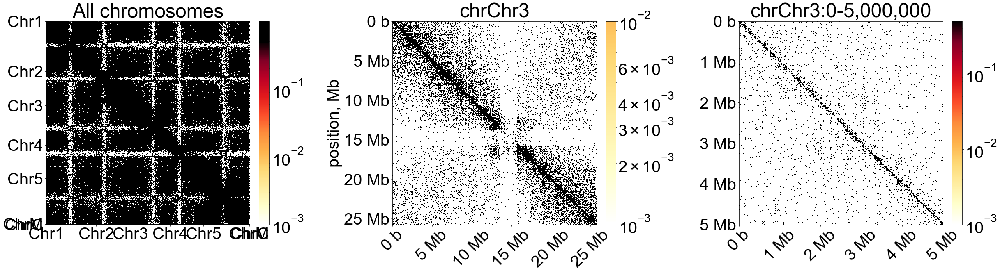

In [11]:
# draw_contact(rep1,region,'/public/home/lizw/task/pore_c/visulization/CEN_rep1')
# draw_contact(rep1,region,'/public/home/lizw/task/pore_c/visulization/CEN_rep2')
draw_contact(merge,region,'/public/home/lizw/task/pore_c/visulization/CEN_repm',False)

Chr1 : (0, 651)
Chr2 : (651, 1096)
Chr3 : (1096, 1611)
Chr4 : (1611, 2043)
Chr5 : (2043, 2633)
ChrM : (2633, 2641)
ChrC : (2641, 2645)


<ipython-input-16-492cc3e44eb7>:39: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  im = ax.matshow(clr_50k.matrix(balance=balance)[:], vmax=0.001,cmap='fall',norm = norm);
<ipython-input-16-492cc3e44eb7>:50: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  im = ax.matshow(
<ipython-input-16-492cc3e44eb7>:64: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  im = ax.matshow(


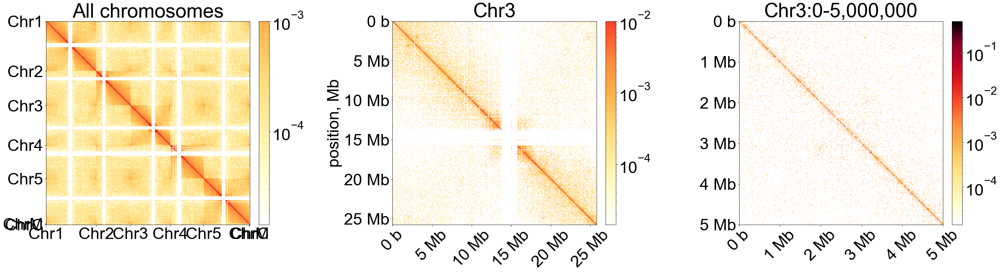

In [19]:
draw_contact(merge_min,region,'/public/home/lizw/task/pore_c/visulization/CEN_repm_min',True)

In [26]:
#the end of peri is calculated based on the tair one add the new added centromere region length
nor_to_peri_2 = ('Chr2',0,6045243+2221453)
nor_to_peri_4 = ('Chr4',0,6500000+2774048)

In [32]:
nor_2 = ('Chr2',0,1000000)
nor_4 = ('Chr4',0,1500000)

Chr1 : (0, 651)
Chr2 : (651, 1096)
Chr3 : (1096, 1611)
Chr4 : (1611, 2043)
Chr5 : (2043, 2633)
ChrM : (2633, 2641)
ChrC : (2641, 2645)


<ipython-input-16-492cc3e44eb7>:39: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  im = ax.matshow(clr_50k.matrix(balance=balance)[:], vmax=0.001,cmap='fall',norm = norm);
<ipython-input-16-492cc3e44eb7>:50: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  im = ax.matshow(
<ipython-input-16-492cc3e44eb7>:64: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  im = ax.matshow(


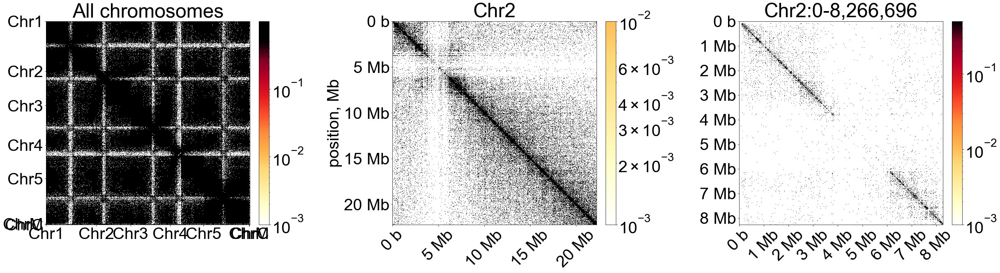

In [29]:
draw_contact(merge_min,nor_to_peri_2,'/public/home/lizw/task/pore_c/visulization/CEN_repm_min',True)

Chr1 : (0, 651)
Chr2 : (651, 1096)
Chr3 : (1096, 1611)
Chr4 : (1611, 2043)
Chr5 : (2043, 2633)
ChrM : (2633, 2641)
ChrC : (2641, 2645)


<ipython-input-16-492cc3e44eb7>:39: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  im = ax.matshow(clr_50k.matrix(balance=balance)[:], vmax=0.001,cmap='fall',norm = norm);
<ipython-input-16-492cc3e44eb7>:50: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  im = ax.matshow(
<ipython-input-16-492cc3e44eb7>:64: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  im = ax.matshow(


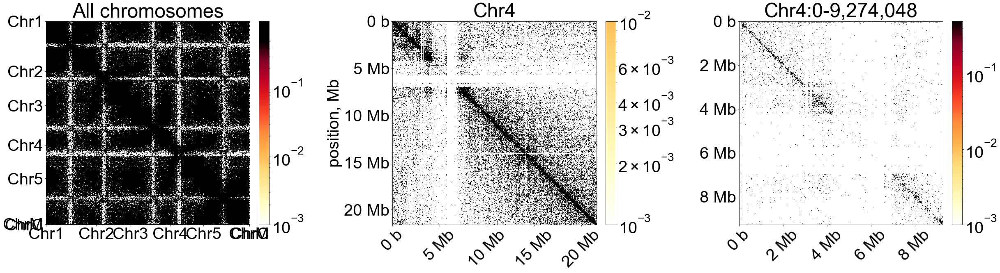

In [30]:
draw_contact(merge_min,nor_to_peri_4,'/public/home/lizw/task/pore_c/visulization/CEN_repm_min',True)

Chr1 : (0, 651)
Chr2 : (651, 1096)
Chr3 : (1096, 1611)
Chr4 : (1611, 2043)
Chr5 : (2043, 2633)
ChrM : (2633, 2641)
ChrC : (2641, 2645)


<ipython-input-16-492cc3e44eb7>:39: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  im = ax.matshow(clr_50k.matrix(balance=balance)[:], vmax=0.001,cmap='fall',norm = norm);
<ipython-input-16-492cc3e44eb7>:50: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  im = ax.matshow(
<ipython-input-16-492cc3e44eb7>:64: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  im = ax.matshow(


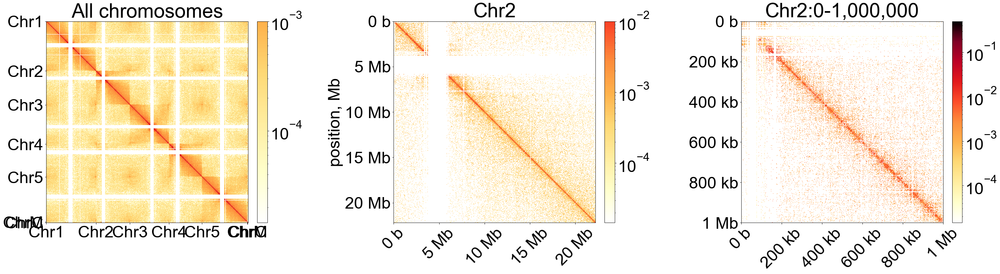

In [33]:
draw_contact(merge_min,nor_2,'/public/home/lizw/task/pore_c/visulization/CEN_repm_min',True)

Chr1 : (0, 651)
Chr2 : (651, 1096)
Chr3 : (1096, 1611)
Chr4 : (1611, 2043)
Chr5 : (2043, 2633)
ChrM : (2633, 2641)
ChrC : (2641, 2645)


<ipython-input-16-492cc3e44eb7>:39: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  im = ax.matshow(clr_50k.matrix(balance=balance)[:], vmax=0.001,cmap='fall',norm = norm);
<ipython-input-16-492cc3e44eb7>:50: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  im = ax.matshow(
<ipython-input-16-492cc3e44eb7>:64: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  im = ax.matshow(


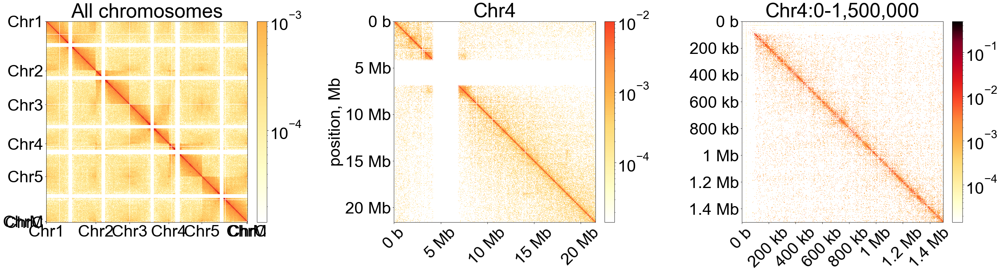

In [34]:
draw_contact(merge_min,nor_4,'/public/home/lizw/task/pore_c/visulization/CEN_repm_min',True)

In [68]:
extend_region = 1000_000

In [69]:
#CENwould be mask in balaced data, use the orginial matrix to draw the centromeric region
CEN1 = ('Chr1',14841109-extend_region,17559778+extend_region)
CEN2 = ('Chr2',3823791-extend_region,6045243+extend_region)
CEN3 = ('Chr3',13597187-extend_region,15733925+extend_region)
CEN4 = ('Chr4',4203901-extend_region,6977949+extend_region)
CEN5 = ('Chr5',11784130-extend_region,14551809+extend_region)

In [70]:
CEN_list = [CEN1,CEN2,CEN3,CEN4,CEN5]
CEN_max = []

In [71]:
#hic_file = '/public/home/lizw/task/pore_c/DpnII_hic2/4DN_cool/MAPQ_1_1000.mcool'
# run06_rep2 = '/public/home/lizw/task/pore_c/porec_1000_filter_mainchr_result/matrix/zb_DpnII_run06_TAIR10_unphased.matrix.mcool'
# run07_rep1 = '/public/home/lizw/task/pore_c/porec_1000_filter_mainchr_result/matrix/zb_DpnII_run07_TAIR10_unphased.matrix.mcool'
# run08_file = '/public/home/lizw/task/pore_c/porec_1000_filter_mainchr_result/matrix/zb_DpnII_run08_TAIR10_unphased.matrix.mcool'
# lowhic_b79 = '/public/home/lizw/task/pore_c/lowinputHIC/B79/MAPQ_1_1000.mcool'
rep1 = '/public/home/lizw/task/pore_c/porec_1000_filter_mainchr_result/pairs/zb_DpnII_run2-1_binbase10.mcool'
rep2 = '/public/home/lizw/task/pore_c/porec_1000_filter_mainchr_result/pairs/zb_DpnII_run2-2_binbase10.mcool'
merge = '/public/home/lizw/task/pore_c/porec_1000_filter_mainchr_result/pairs/zb_DpnII_run2-m_binbase10.mcool'

In [183]:
def draw_CEN(coolerfile,prefix,resolution,regionlist):
    from cooltools.lib.numutils import adaptive_coarsegrain, interp_nan
    import cooltools
    import cooler
    import cooltools.lib.plotting
    from matplotlib.colors import LogNorm

    #font setting
    import matplotlib.font_manager as font_manager
    font_dirs = ["/public/home/lizw/software/font"]
    font_files = font_manager.findSystemFonts(fontpaths=font_dirs)
    for font_file in font_files:
        font_manager.fontManager.addfont(font_file)
    plt.rcParams["font.family"] = "Arial"
    plt.rcParams["font.size"] = 30
    
    clr = cooler.Cooler(f'{coolerfile}::resolutions/{resolution}')
    norm = LogNorm()
    chromstarts = []
#     for i in clr.chromnames:
#         print(f'{i} : {clr.extent(i)}')
#         chromstarts.append(clr.extent(i)[0])

    from matplotlib.ticker import EngFormatter
    bp_formatter = EngFormatter('b')

    def format_ticks(ax, x=True, y=True, rotate=True):
        if y:
            ax.yaxis.set_major_formatter(bp_formatter)
        if x:
            ax.xaxis.set_major_formatter(bp_formatter)
            ax.xaxis.tick_bottom()
        if rotate:
            ax.tick_params(axis='x',rotation=45)

    f, axs = plt.subplots(
        figsize=(10,50),
        nrows=len(regionlist))
    
    #Cen1
    for i in np.arange(5):
        region = regionlist[i]
        ax = axs[i]
        
        cg = adaptive_coarsegrain(clr.matrix(balance=True).fetch(region),
                              clr.matrix(balance=False).fetch(region),
                              cutoff=3, max_levels=8)
        cgi = interp_nan(cg)
        
        im = ax.matshow(
            cgi,
            #vmax=0.01,
            #cmap='fall',
            norm = norm,
            extent=(region[1], region[2], region[2], region[1])
        );
        chrom = region[0]
        ax.set_title(f'CEN{i+1}')
        plt.colorbar(im, ax=ax ,fraction=0.046, pad=0.04, label='');

    
    #CEN5
    #final
    format_ticks(ax)
    plt.tight_layout()
    plt.savefig(f'{prefix}_coolmatrix_visualization.png',dpi=300,format='png',bbox_inches = 'tight')

/public/home/lizw/anaconda3/envs/cooltools/lib/python3.9/site-packages/cooltools/lib/numutils.py:1355: RuntimeWarning: invalid value encountered in true_divide
  val_cur = ar_cur / armask_cur


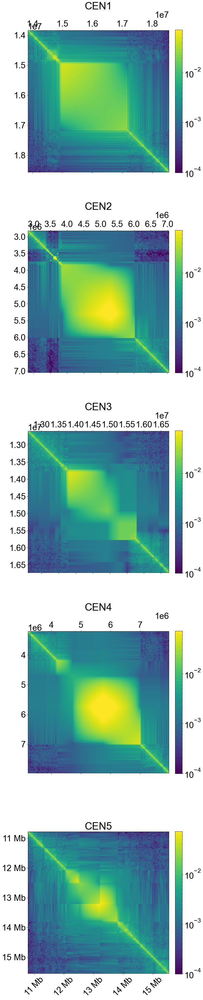

In [185]:
draw_CEN(merge,'merge',10000,CEN_list)

In [82]:
ignore_diag = '/public/home/lizw/task/pore_c/porec_1000_filter_mainchr_result/matrix/zb_ignore-diags-DpnII_run2-m_col_CEN_unphased.matrix.mcool'
min_filter = '/public/home/lizw/task/pore_c/porec_1000_filter_mainchr_result/matrix/zb_min_DpnII_run2-m_col_CEN_unphased.matrix.mcool'

In [88]:
Chr1 = ('Chr1',0,32540122)
Chr2 = ('Chr2',0,22217084)
Chr3 = ('Chr3',0,25743512)
Chr4 = ('Chr4',0,21578073)
Chr5 = ('Chr5',0,29480885)

In [90]:
Chr_list=[Chr1,Chr2,Chr3,Chr4,Chr5]

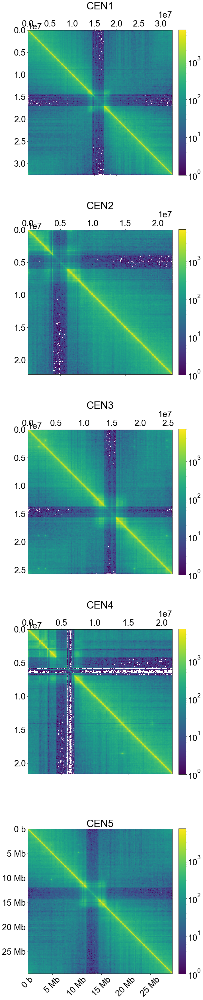

In [91]:
draw_CEN(merge,'whole_chr_merge',100000,False,Chr_list)

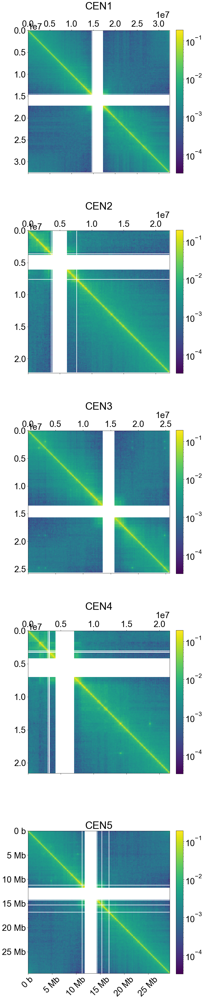

In [92]:
draw_CEN(merge,'whole_chr_merge',100000,True,Chr_list)

In [170]:
def draw_whole(coolerfile,prefix,balance):
    from cooltools.lib.numutils import adaptive_coarsegrain, interp_nan
    import cooltools 
    import cooler
    import cooltools.lib.plotting
    from matplotlib.colors import LogNorm

    #font setting
    import matplotlib.font_manager as font_manager
    font_dirs = ["/public/home/lizw/software/font"]
    font_files = font_manager.findSystemFonts(fontpaths=font_dirs)
    for font_file in font_files:
        font_manager.fontManager.addfont(font_file)
    plt.rcParams["font.family"] = "Arial"
    plt.rcParams["font.size"] = 40
    clr_50k = cooler.Cooler(f'{coolerfile}::resolutions/50000')
    norm = LogNorm(vmax=50_000)
    chromstarts = []
    chromends = []
    for i in clr_50k.chromnames[:5]:
        print(f'{i} : {clr_50k.extent(i)}')
        chromstarts.append(clr_50k.extent(i)[0])
        chromends.append(clr_50k.extent(i)[1])
    
    from matplotlib.ticker import EngFormatter
    bp_formatter = EngFormatter('b')

    def format_ticks(ax, x=True, y=True, rotate=True):
        if y:
            ax.yaxis.set_major_formatter(bp_formatter)
        if x:
            ax.xaxis.set_major_formatter(bp_formatter)
            ax.xaxis.tick_bottom()
        if rotate:
            ax.tick_params(axis='x',rotation=45)

    f, axs = plt.subplots(
        figsize=(35,10),
        ncols=1)
    
    ax = axs
    
    cg = adaptive_coarsegrain(clr_50k.matrix(balance=True)[:],
                              clr_50k.matrix(balance=False)[:],
                              cutoff=3, max_levels=8)
    
    cgi = interp_nan(cg)
    
    im = ax.matshow(cgi, vmax=0.001,norm = norm);
    plt.colorbar(im, ax=ax ,fraction=0.046, pad=0.04, label='');
    ax.set_xticks(chromstarts)
    ax.set_xticklabels(clr_50k.chromnames[:5])
    ax.set_yticks(chromstarts)
    ax.set_yticklabels(clr_50k.chromnames[:5])
    ax.xaxis.tick_bottom()
    ax.set_title('All chromosomes')
    plt.savefig(f'{prefix}_{balance}_coolmatrix_visualization.png',dpi=300,format='png',bbox_inches = 'tight')

Chr1 : (0, 651)
Chr2 : (651, 1096)
Chr3 : (1096, 1611)
Chr4 : (1611, 2043)
Chr5 : (2043, 2633)


/public/home/lizw/anaconda3/envs/cooltools/lib/python3.9/site-packages/cooltools/lib/numutils.py:1355: RuntimeWarning: invalid value encountered in true_divide
  val_cur = ar_cur / armask_cur
<ipython-input-170-a833b376ab62>:49: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  im = ax.matshow(cgi, vmax=0.001,norm = norm);


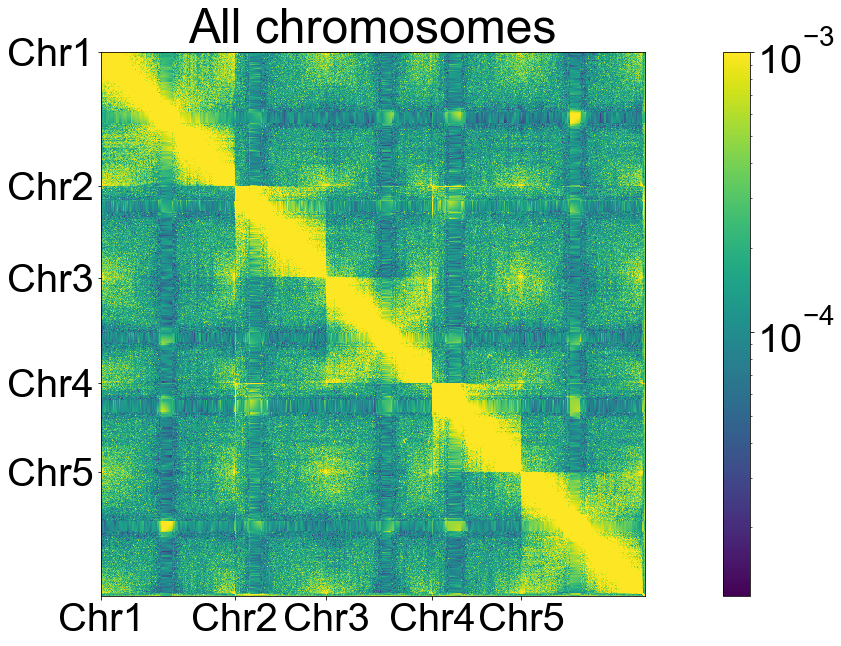

In [171]:
draw_whole(merge,'whole_chr_merge',True)

In [131]:
run08_file = '/public/home/lizw/task/pore_c/porec_1000_filter_mainchr_result/matrix/zb_DpnII_run08_TAIR10_unphased.matrix.mcool'

1 : (0, 609)
2 : (609, 1003)
3 : (1003, 1473)
4 : (1473, 1845)
5 : (1845, 2385)


<ipython-input-170-a833b376ab62>:49: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  im = ax.matshow(cgi, vmax=0.001,norm = norm);


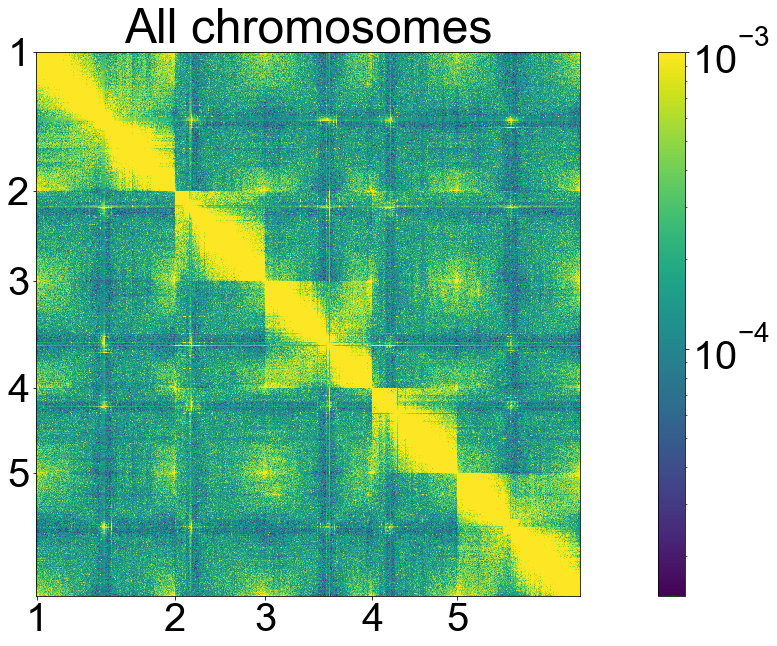

In [172]:
draw_whole(run08_file,'whole_chr_merge_tair10',True)